In [1]:
import cv2
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from skimage import __version__ as skimage_version

print("cv2:", cv2.__version__)
print("numpy:", np.__version__)
print("matplotlib:", matplotlib.__version__)
print("skimage:", skimage_version)

cv2: 4.8.0
numpy: 1.24.4
matplotlib: 3.7.3
skimage: 0.21.0


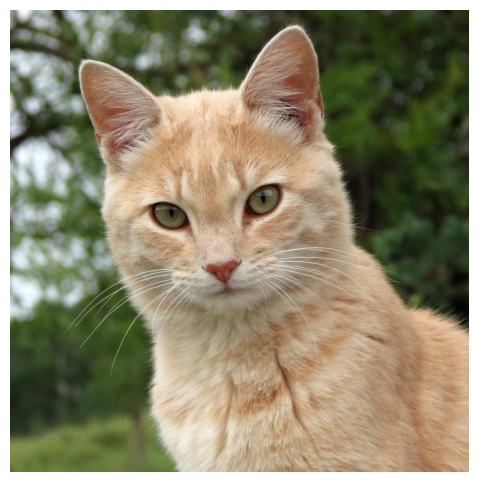

In [2]:
def read_image(path, mode='RGB'):
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    if img is None:
        return None
    mode = mode.upper()
    if mode == 'GRAYSCALE':
        img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    elif mode == 'RGB':
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    elif mode == 'HSV':
        img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    elif mode == 'LAB':
        img = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)
    elif mode == 'CMY':
        img = 255 - cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

def show_image(img, cmap=None, size=(6, 6)):
    plt.figure(figsize=size)
    if len(img.shape) == 2:
        plt.imshow(img, cmap='gray')
    else:
        plt.imshow(img, cmap=cmap)
    plt.axis('off')
    plt.show()

path = "data/cat.jpg"

cat = read_image(path)
show_image(cat)

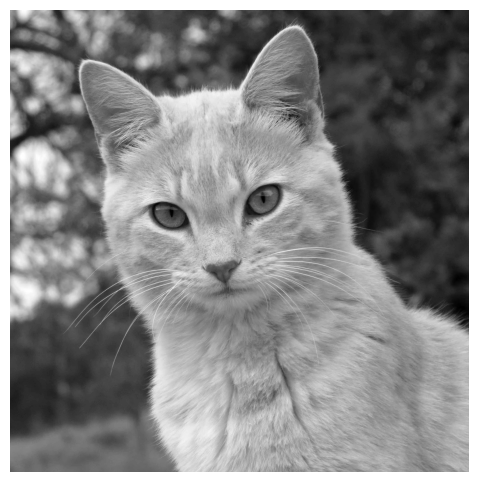

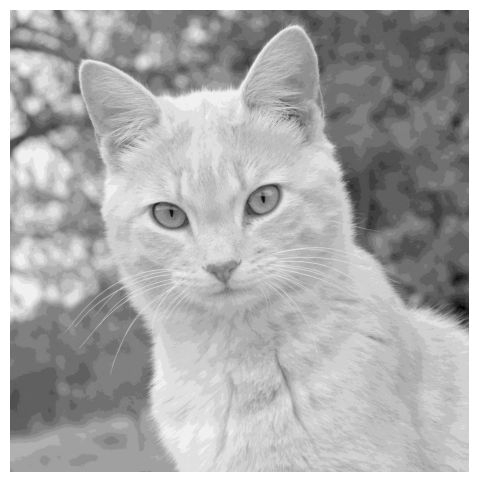

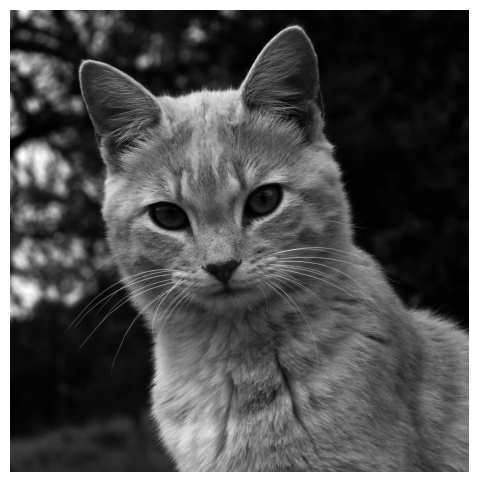

In [3]:
def convert_color(img, mode='RGB'):
    mode = mode.upper()
    if mode == 'GRAYSCALE':
        return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if mode == 'HSV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    if mode == 'LAB':
        return cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    if mode == 'CMY':
        return 255 - img
    return img

def normalize(img):
    return img.astype(np.float32) / 255

def denormalize(img):
    return np.clip(img * 255, 0, 255).astype(np.uint8)

def true_grayscale_normalize(img):
    gray = convert_color(img, 'GRAYSCALE')
    return gray.astype(np.float32) / 255

def point_process(img, func, normalize_output=False):
    out = func(img)
    if normalize_output:
        return np.clip(out, 0, 1)
    return np.clip(out, 0, 255).astype(np.uint8)

show_image(convert_color(cat, 'GRAYSCALE'))
show_image(point_process(true_grayscale_normalize(cat), lambda x: 16 * np.sqrt(x)))
show_image(point_process(true_grayscale_normalize(cat), lambda x: np.power(x, 2.2), normalize_output=True), cmap='gray')

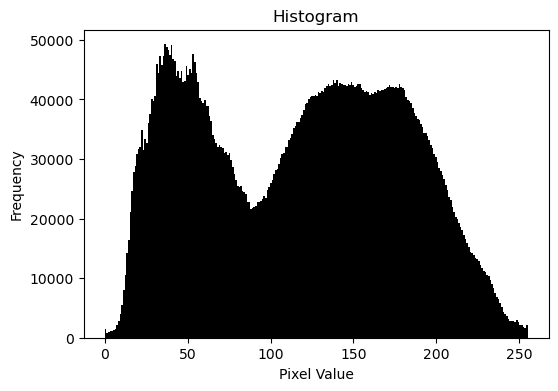

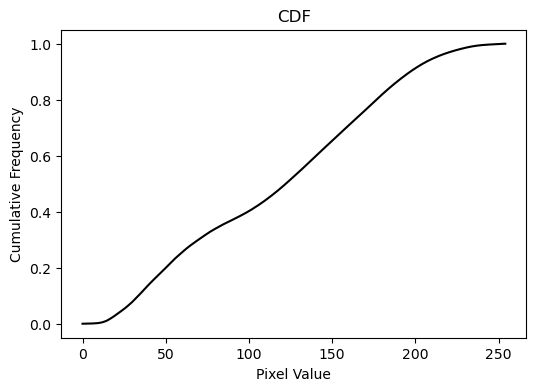

In [4]:
def show_histogram(img, separate=False):
    plt.figure(figsize=(6, 4))
    if len(img.shape) == 2 or not separate:
        plt.hist(img.ravel(), bins=256, range=(img.min(), img.max()), color='black')
    else:
        for i, c in enumerate(['r', 'g', 'b']):
            plt.hist(img[:, :, i].ravel(), bins=256, range=(img[:, :, i].min(), img[:, :, i].max()), color=c, alpha=0.5)
    plt.title('Histogram')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.show()

def show_cdf(img, separate=False):
    plt.figure(figsize=(6, 4))
    def compute_cdf(channel):
        hist, bins = np.histogram(channel.ravel(), bins=256, range=(channel.min(), channel.max()))
        cdf = hist.cumsum()
        return bins[:-1], cdf / cdf[-1]

    if len(img.shape) == 2 or not separate:
        x, y = compute_cdf(img)
        plt.plot(x, y, color='black')
    else:
        for i, c in enumerate(['r', 'g', 'b']):
            x, y = compute_cdf(img[:, :, i])
            plt.plot(x, y, color=c)
    plt.title('CDF')
    plt.xlabel('Pixel Value')
    plt.ylabel('Cumulative Frequency')
    plt.show()

show_histogram(cat)
show_cdf(cat)

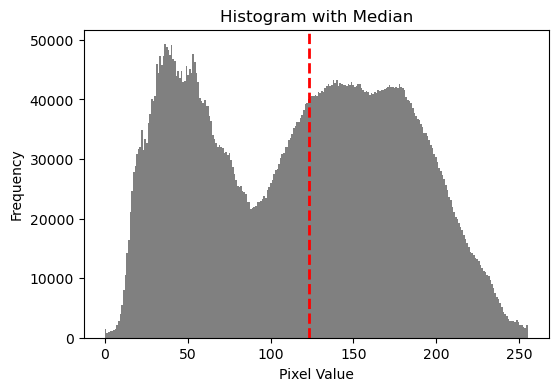

123.0

In [5]:
def show_histogram_with_median(img):
    plt.figure(figsize=(6, 4))
    values = img.ravel()
    plt.hist(values, bins=256, range=(values.min(), values.max()), color='gray')
    median = np.median(values)
    plt.axvline(median, color='red', linestyle='--', linewidth=2)
    plt.title('Histogram with Median')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.show()
    return median

show_histogram_with_median(cat)

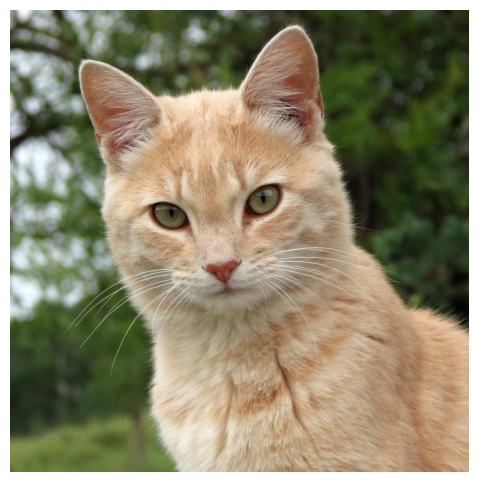

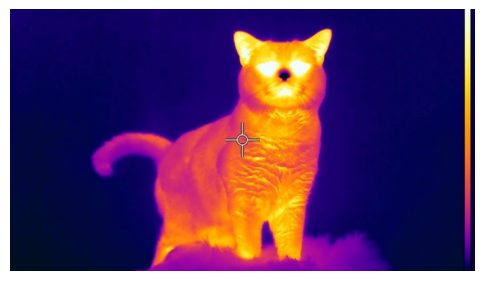

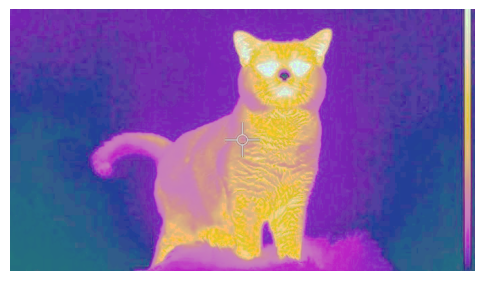

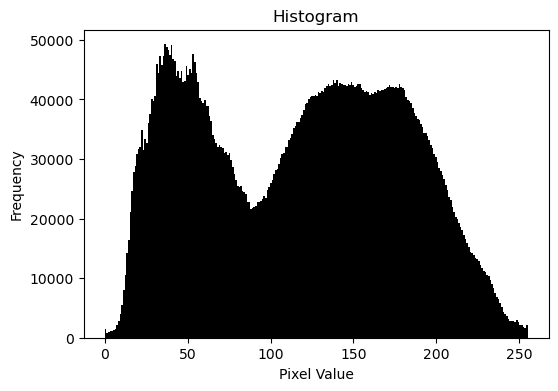

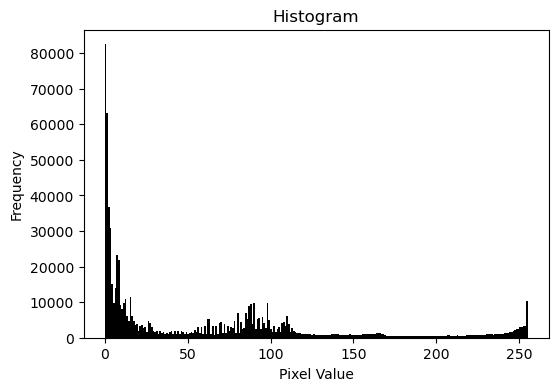

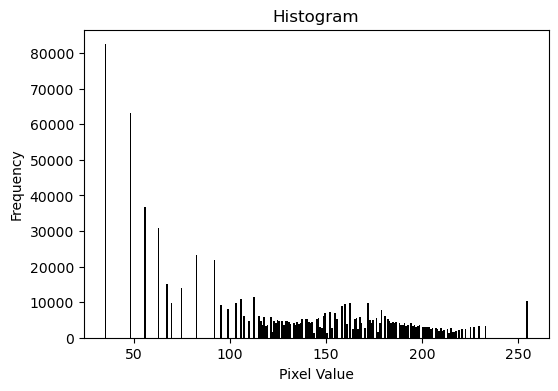

In [6]:
def histogram_match(source, reference):
    src = source.ravel()
    ref = reference.ravel()

    src_hist, src_bins = np.histogram(src, bins=256, range=(0, 256), density=True)
    ref_hist, ref_bins = np.histogram(ref, bins=256, range=(0, 256), density=True)

    src_cdf = np.cumsum(src_hist)
    ref_cdf = np.cumsum(ref_hist)

    lut = np.zeros(256, dtype=np.uint8)
    ref_idx = 0
    for src_idx in range(256):
        while ref_idx < 255 and ref_cdf[ref_idx] < src_cdf[src_idx]:
            ref_idx += 1
        lut[src_idx] = ref_idx

    matched = lut[source]
    return matched

show_image(cat)
next_path = 'data/tir_cat.jpg'
tir_cat = read_image(next_path)
show_image(tir_cat)

matched_cat = histogram_match(tir_cat, cat)
show_image(matched_cat)
show_histogram(cat)
show_histogram(tir_cat)
show_histogram(matched_cat)

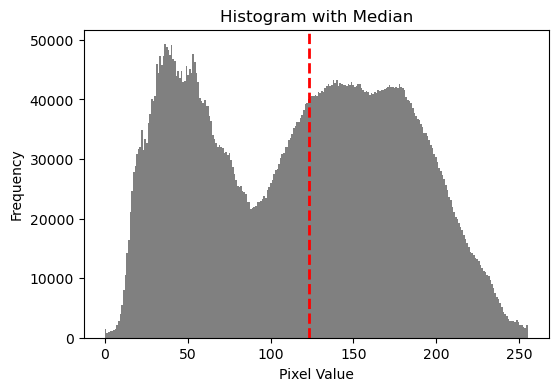

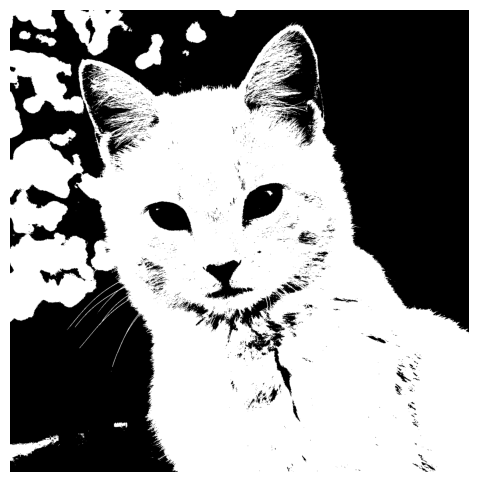

In [7]:
def threshold(img, value):
    return (img > value).astype(np.uint8)

median_cat = show_histogram_with_median(cat)

show_image(threshold(true_grayscale_normalize(cat), median_cat / 255))

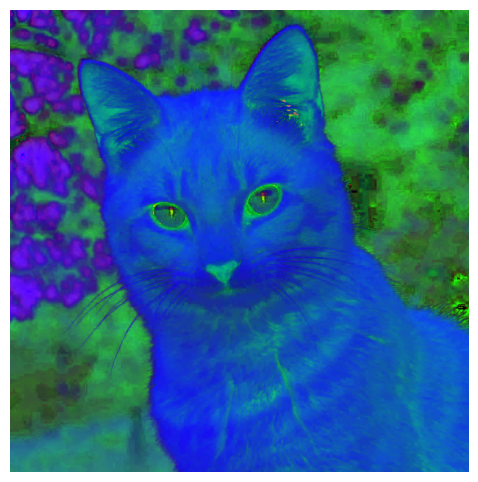

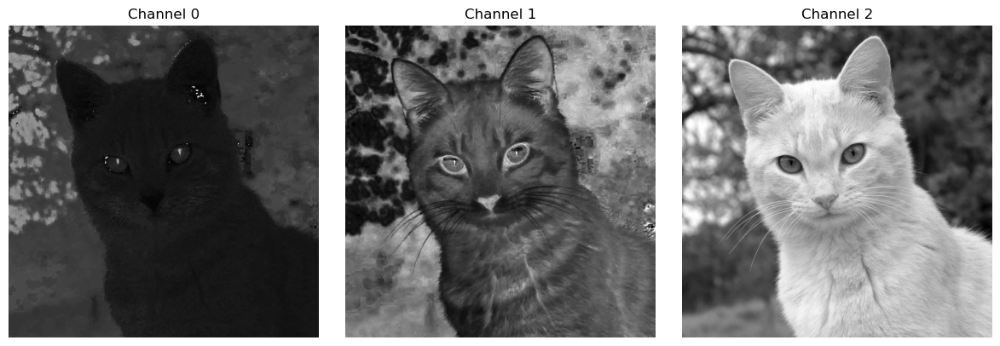

In [8]:
def show_all_channels(img):
    if len(img.shape) == 2:
        show_image(img, cmap='gray')
        return
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    for i in range(3):
        axs[i].imshow(img[:, :, i], cmap='gray')
        axs[i].set_title(f'Channel {i}')
        axs[i].axis('off')
    plt.tight_layout()
    plt.show()

show_image(convert_color(cat, 'HSV'))
show_all_channels(convert_color(cat, 'HSV'))

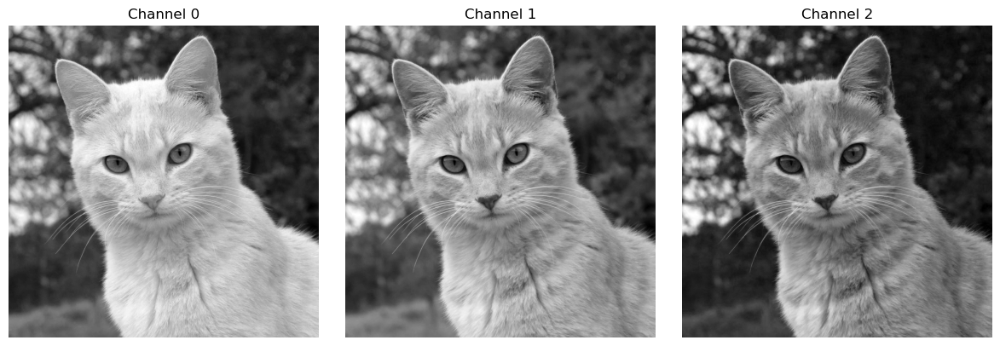

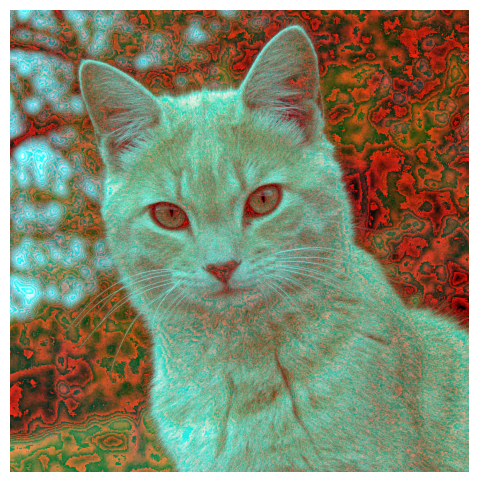

In [9]:
def color_filter(img, channel, func):
    if len(img.shape) == 2:
        return img
    out = img.copy()
    out[:, :, channel] = np.clip(func(out[:, :, channel]), 0, 255).astype(np.uint8)
    return out

show_all_channels(cat)
show_image(color_filter(cat, 0, lambda x: x * 16))

In [10]:
def read_image_from_txt(path):
    data = np.loadtxt(path)
    return data.astype(np.uint8)

from skimage.metrics import peak_signal_noise_ratio, structural_similarity
import warnings

def compute_psnr(img1, img2):
    if img1.shape != img2.shape:
        warnings.warn("Images have different shapes.")
        return None
    return peak_signal_noise_ratio(img1, img2, data_range=img1.max() - img1.min())

def compute_ssim(img1, img2):
    if img1.shape != img2.shape:
        warnings.warn("Images have different shapes.")
        return None
    if len(img1.shape) == 2:
        return structural_similarity(img1, img2, data_range=img1.max() - img1.min())
    return structural_similarity(img1, img2, multichannel=True, data_range=img1.max() - img1.min())

def compute_mse(img1, img2):
    if img1.shape != img2.shape:
        warnings.warn("Images have different shapes.")
        return None
    return np.mean((img1.astype(np.float32) - img2.astype(np.float32)) ** 2)


cat1 = convert_color(cat, 'GRAYSCALE')
cat2 = point_process(true_grayscale_normalize(cat), lambda x: 16 * np.sqrt(x))

print(compute_psnr(cat1, cat2))
print(compute_ssim(cat1, cat2))

6.127850926101878
0.13901491680213493


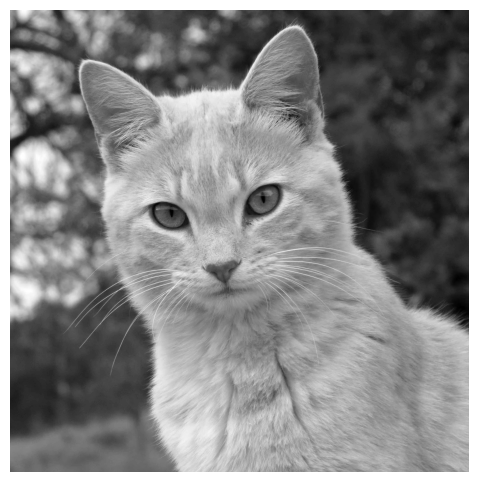

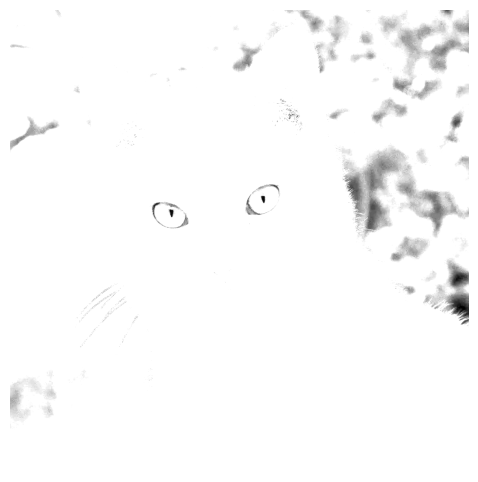

In [11]:
kernel = np.array([[0, -1, 0],
                   [-1, 10, -1],
                   [0, -1, 0]])

def convolve(img, kernel, pad=0, stride=1):
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    k_h, k_w = kernel.shape
    i_h, i_w = img.shape

    img_padded = np.pad(img, pad, mode='constant')
    out_h = (i_h + 2 * pad - k_h) // stride + 1
    out_w = (i_w + 2 * pad - k_w) // stride + 1

    out = np.zeros((out_h, out_w), dtype=np.float32)

    for y in range(0, out_h):
        for x in range(0, out_w):
            region = img_padded[y*stride:y*stride+k_h, x*stride:x*stride+k_w]
            out[y, x] = np.sum(region * kernel)

    return np.clip(out, 0, 255).astype(np.uint8)

from scipy.signal import convolve2d

def fast_convolve(img, kernel, pad=0, stride=1):
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if pad > 0:
        img = np.pad(img, pad, mode='constant')

    conv = convolve2d(img, kernel, mode='valid')
    if stride > 1:
        conv = conv[::stride, ::stride]

    return np.clip(conv, 0, 255).astype(np.uint8)


show_image(convert_color(cat, 'GRAYSCALE'))
show_image(fast_convolve(convert_color(cat, 'GRAYSCALE'), kernel))

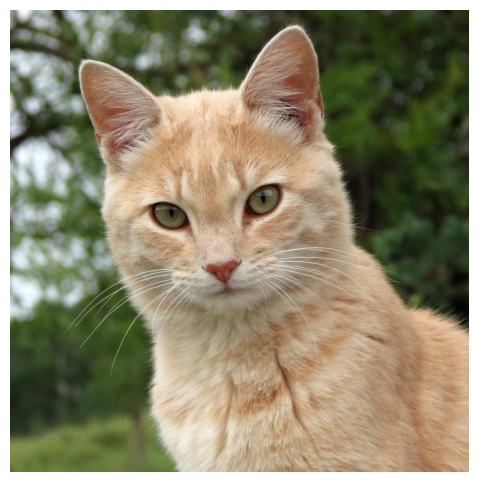

In [12]:
show_image(cat)

In [13]:
from scipy.ndimage import gaussian_filter, median_filter

def gaussian_blur(img, size=3, strength=1.0, pad=0, stride=1):
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if pad > 0:
        img = np.pad(img, pad, mode='constant')
    blurred = gaussian_filter(img, sigma=size * strength)
    if stride > 1:
        blurred = blurred[::stride, ::stride]
    return np.clip(blurred, 0, 255).astype(np.uint8)

def median_blur(img, size=3, strength=1.0, pad=0, stride=1):
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if pad > 0:
        img = np.pad(img, pad, mode='constant')
    final_size = max(1, int(size * strength) | 1)
    filtered = median_filter(img, size=final_size)
    if stride > 1:
        filtered = filtered[::stride, ::stride]
    return np.clip(filtered, 0, 255).astype(np.uint8)

from scipy.ndimage import generic_filter

def outlier_filter(img, size=3, strength=1.0, pad=0, stride=1):
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if pad > 0:
        img = np.pad(img, pad, mode='constant')
    final_size = max(1, int(size * strength) | 1)

    def remove_outliers(window):
        center = window[len(window) // 2]
        median = np.median(window)
        return median if abs(center - median) > np.std(window) else center

    filtered = generic_filter(img, remove_outliers, size=final_size)
    if stride > 1:
        filtered = filtered[::stride, ::stride]
    return np.clip(filtered, 0, 255).astype(np.uint8)

from scipy.ndimage import uniform_filter

def mean_blur(img, size=3, strength=1.0, pad=0, stride=1):
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if pad > 0:
        img = np.pad(img, pad, mode='constant')
    final_size = max(1, int(size * strength) | 1)
    blurred = uniform_filter(img, size=final_size)
    if stride > 1:
        blurred = blurred[::stride, ::stride]
    return np.clip(blurred, 0, 255).astype(np.uint8)

def fast_outlier_filter(img, size=3, strength=1.0, pad=0, stride=1, threshold_factor=1.0):
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if pad > 0:
        img = np.pad(img, pad, mode='constant')

    final_size = max(1, int(size * strength) | 1)
    med = median_filter(img, size=final_size)
    std = uniform_filter((img - med)**2, size=final_size) ** 0.5
    outliers = np.abs(img - med) > (threshold_factor * std)
    img_filtered = np.where(outliers, med, img)

    if stride > 1:
        img_filtered = img_filtered[::stride, ::stride]

    return np.clip(img_filtered, 0, 255).astype(np.uint8)
    
# show_image(gaussian_blur(cat, size=5, strength=10.0))
# show_image(median_blur(cat, size=5, strength=5.0))
# show_image(outlier_filter(cat, size=5, strength=5.0))
# show_image(mean_filter(cat, size=5, strength=5.0))

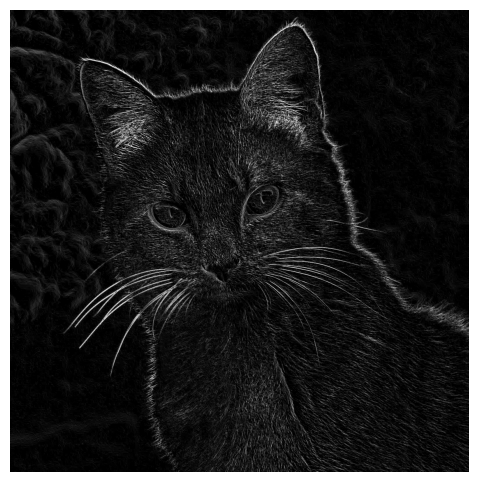

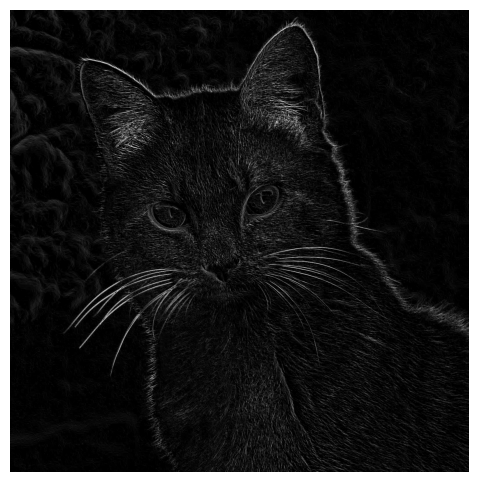

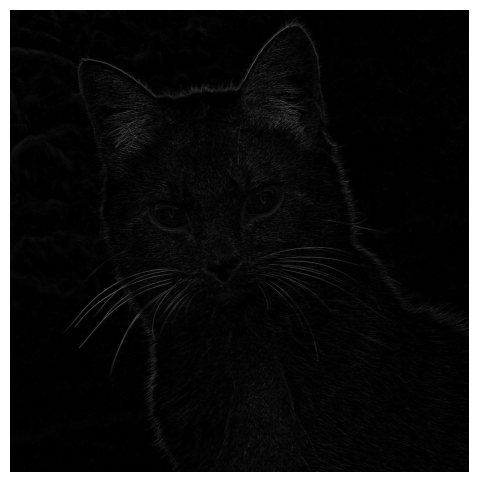

In [14]:
sobel_x = np.array([[-1, 0, 1],
                    [-2, 0, 2],
                    [-1, 0, 1]], dtype=np.float32)

sobel_y = np.array([[1, 2, 1],
                    [0, 0, 0],
                    [-1, -2, -1]], dtype=np.float32)

prewitt_x = np.array([[-1, 0, 1],
                      [-1, 0, 1],
                      [-1, 0, 1]], dtype=np.float32)

prewitt_y = np.array([[1, 1, 1],
                      [0, 0, 0],
                      [-1, -1, -1]], dtype=np.float32)

roberts_x = np.array([[1, 0],
                      [0, -1]], dtype=np.float32)

roberts_y = np.array([[0, 1],
                      [-1, 0]], dtype=np.float32)

def apply_edge_filter(img, kx, ky):
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    gx = fast_convolve(img, kx)
    gy = fast_convolve(img, ky)
    magnitude = np.sqrt(gx.astype(np.float32)**2 + gy.astype(np.float32)**2)
    return np.clip(magnitude, 0, 255).astype(np.uint8)

show_image(apply_edge_filter(cat, sobel_x, sobel_y))
show_image(apply_edge_filter(cat, prewitt_x, prewitt_y))
show_image(apply_edge_filter(cat, roberts_x, roberts_y))

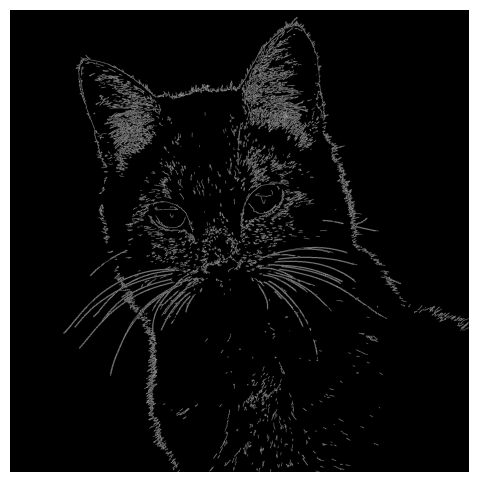

In [15]:
def canny_edge(img, low=100, high=200):
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(img, low, high)
    return edges

show_image(canny_edge(cat))

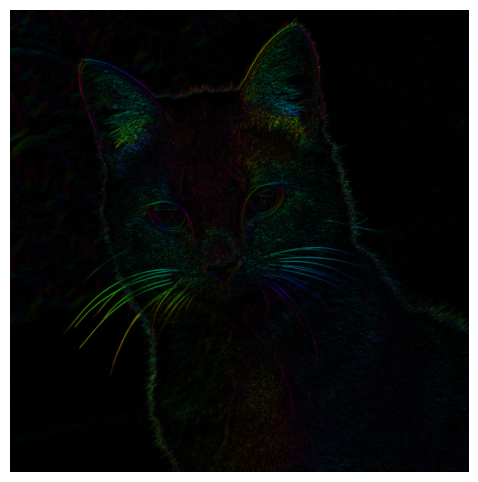

In [66]:
def gradient_magnitude(dx, dy):
    return np.sqrt(dx**2 + dy**2)

def gradient_direction(dx, dy):
    angle = np.arctan2(dy, dx)  # radians
    angle = np.degrees(angle)   # convert to degrees
    angle = (angle + 180) % 180  # map to [0, 180)
    return angle.astype(np.uint8)

def get_hsv_edge(img, kernel='sobel'):
    if len(img.shape) == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        gray = img.copy()

    # Select kernels
    if kernel == 'sobel':
        dx = cv2.Sobel(gray, cv2.CV_32F, 1, 0, ksize=3)
        dy = cv2.Sobel(gray, cv2.CV_32F, 0, 1, ksize=3)
    elif kernel == 'prewitt':
        kx = np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]])
        ky = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])
        dx = cv2.filter2D(gray.astype(np.float32), -1, kx)
        dy = cv2.filter2D(gray.astype(np.float32), -1, ky)
    else:
        raise ValueError("Unsupported kernel. Use 'sobel' or 'prewitt'.")

    mag = gradient_magnitude(dx, dy)
    ang = gradient_direction(dx, dy)

    mag = np.clip((mag / mag.max()) * 255, 0, 255).astype(np.uint8)

    hsv = np.zeros((gray.shape[0], gray.shape[1], 3), dtype=np.uint8)
    hsv[..., 0] = ang  # Hue (direction)
    hsv[..., 1] = 255  # Saturation
    hsv[..., 2] = mag  # Value (magnitude)

    hsv_bgr = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)
    return hsv_bgr

show_image(get_hsv_edge(cat))

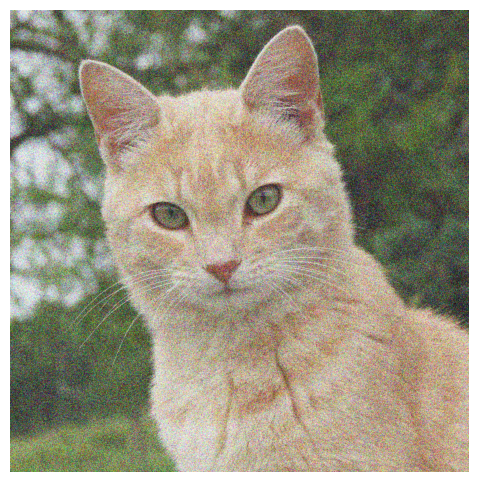

In [20]:
def add_gaussian_noise(img, mean=0, std=10):
    noise = np.random.normal(mean, std, img.shape)
    noisy = img.astype(np.float32) + noise
    return np.clip(noisy, 0, 255).astype(np.uint8)

def add_salt_pepper_noise(img, amount=0.01, salt_vs_pepper=0.5):
    noisy = img.copy()
    total = np.prod(img.shape[:2])
    num_salt = int(amount * total * salt_vs_pepper)
    num_pepper = int(amount * total * (1 - salt_vs_pepper))

    coords = tuple(np.random.randint(0, i, num_salt) for i in img.shape[:2])
    if len(img.shape) == 2:
        noisy[coords] = 255
    else:
        noisy[coords[0], coords[1], :] = 255

    coords = tuple(np.random.randint(0, i, num_pepper) for i in img.shape[:2])
    if len(img.shape) == 2:
        noisy[coords] = 0
    else:
        noisy[coords[0], coords[1], :] = 0

    return noisy

def add_speckle_noise(img, strength=0.1):
    noise = np.random.randn(*img.shape)
    noisy = img.astype(np.float32) + img.astype(np.float32) * noise * strength
    return np.clip(noisy, 0, 255).astype(np.uint8)


show_image(add_gaussian_noise(cat, 20, 100))

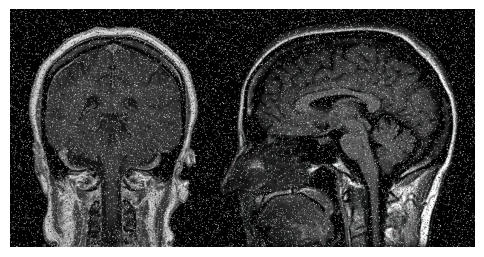

In [24]:
brain_path = "data/mri_brain.jpg"

mri = read_image(brain_path)

sp_mri = add_salt_pepper_noise(mri, 0.1)

show_image(sp_mri)

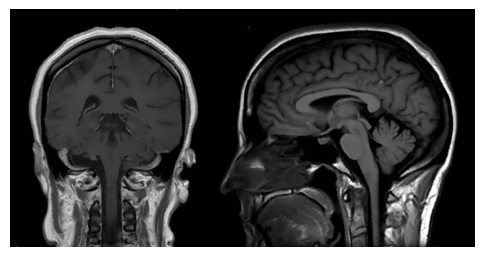

In [26]:
show_image(median_blur(sp_mri))

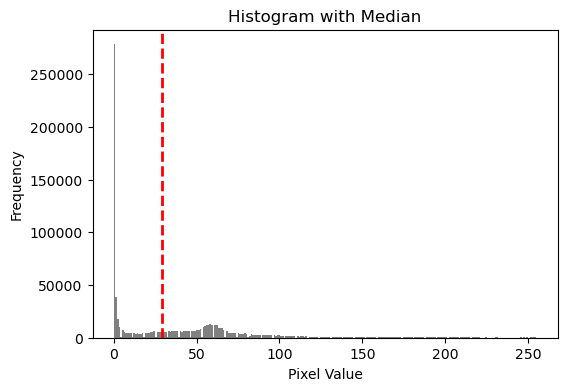

In [28]:
mri_median = show_histogram_with_median(mri)

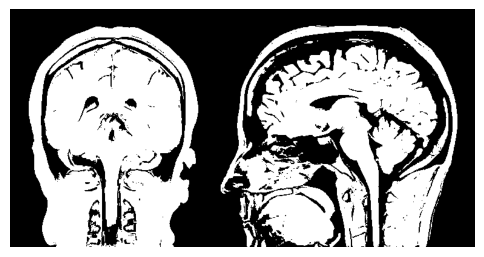

In [30]:
threshold_mri = threshold(true_grayscale_normalize(mri), mri_median / 255)
show_image(threshold_mri)

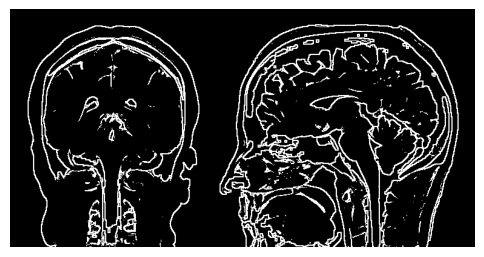

In [36]:
from scipy.ndimage import binary_erosion, binary_dilation, binary_opening, binary_closing

def erode(img, se=np.ones((3,3)), iterations=1):
    return binary_erosion(img, structure=se, iterations=iterations).astype(np.uint8)

def dilate(img, se=np.ones((3,3)), iterations=1):
    return binary_dilation(img, structure=se, iterations=iterations).astype(np.uint8)

def open_img(img, se=np.ones((3,3)), iterations=1):
    return binary_opening(img, structure=se, iterations=iterations).astype(np.uint8)

def close_img(img, se=np.ones((3,3)), iterations=1):
    return binary_closing(img, structure=se, iterations=iterations).astype(np.uint8)

square_se = np.ones((5, 5))
cross_se = np.array([[0,1,0],[1,1,1],[0,1,0]])
line_se = np.array([[1, 1, 1]])

show_image(threshold_mri - dilate(threshold_mri, square_se))

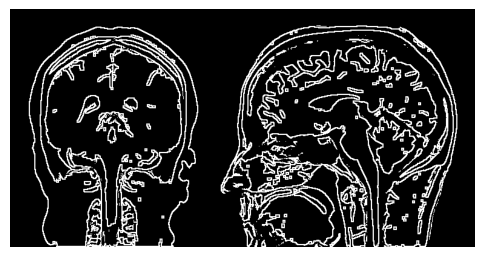

In [37]:
show_image(erode(threshold_mri, square_se) - threshold_mri)

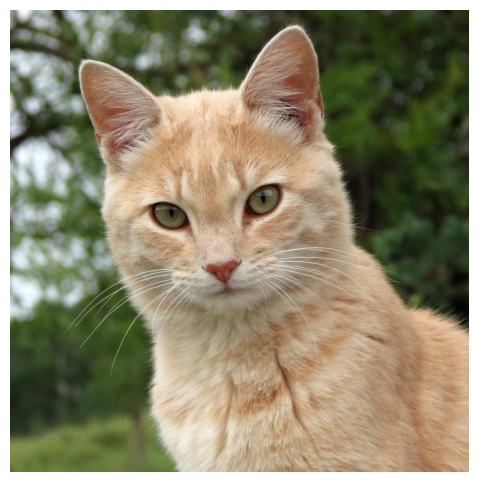

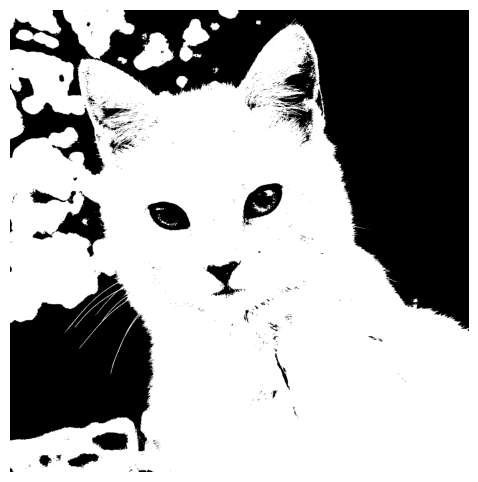

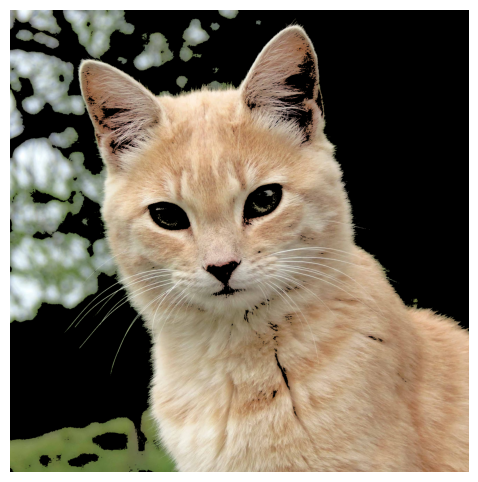

In [43]:
def apply_mask(img, mask):
    if len(mask.shape) == 2 and len(img.shape) == 3:
        mask = mask[:, :, np.newaxis]
    return (img * mask).astype(np.uint8)

show_image(cat)

binary_cat = threshold(true_grayscale_normalize(cat), 100 / 255)
show_image(binary_cat)
show_image(apply_mask(cat, binary_cat))

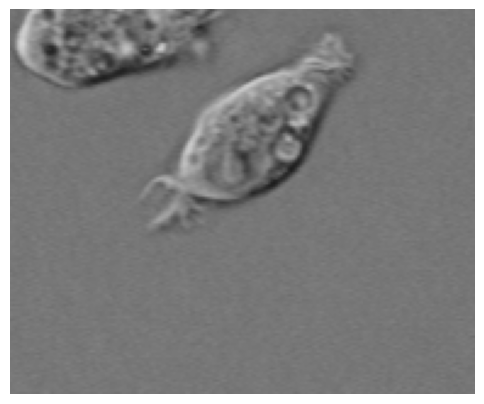

In [44]:
cell_path = 'data/cells.png'

cell = read_image(cell_path)
show_image(cell)

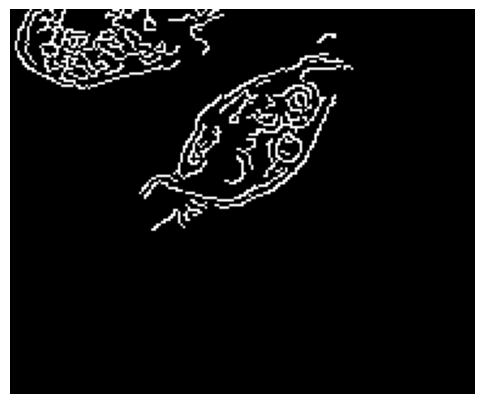

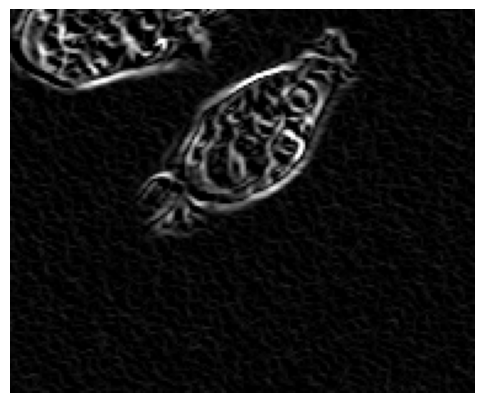

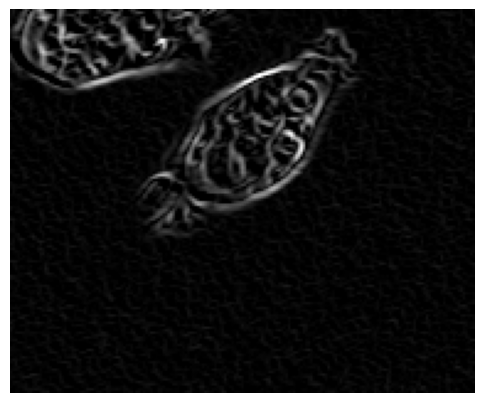

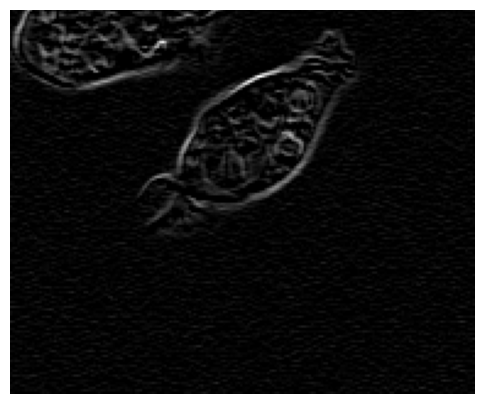

In [53]:
edge_cell = canny_edge(cell)
show_image(edge_cell)

show_image(apply_edge_filter(cell, sobel_x, sobel_y))
show_image(apply_edge_filter(cell, prewitt_x, prewitt_y))
show_image(apply_edge_filter(cell, roberts_x, roberts_y))

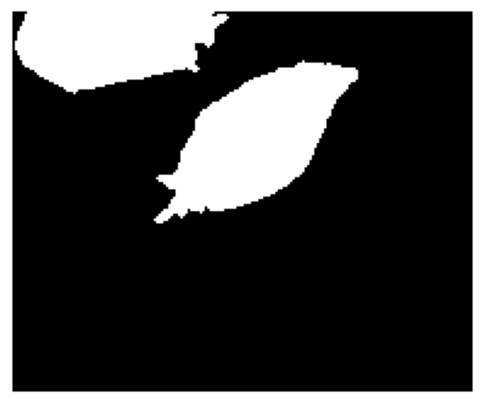

In [61]:
img = read_image("data/cells.png", mode='GRAYSCALE')

def invert_binary(img):
    if img.max() <= 1:
        return 1 - img
    return 255 - img


blurred = gaussian_blur(img, size=2, strength=1.5)
_, binary = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

binary = binary.astype(np.uint8)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
opened = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=2)

dist = cv2.distanceTransform(opened, cv2.DIST_L2, 5)
_, sure_fg = cv2.threshold(dist, 0.5 * dist.max(), 255, 0)
sure_fg = sure_fg.astype(np.uint8)
sure_bg = cv2.dilate(opened, kernel, iterations=3)
unknown = cv2.subtract(sure_bg, sure_fg)

_, markers = cv2.connectedComponents(sure_fg)
markers = markers + 1
markers[unknown == 255] = 0

color = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
markers = cv2.watershed(color, markers)
segmented = np.zeros_like(img)
segmented[markers > 1] = 255

show_image(invert_binary(segmented))

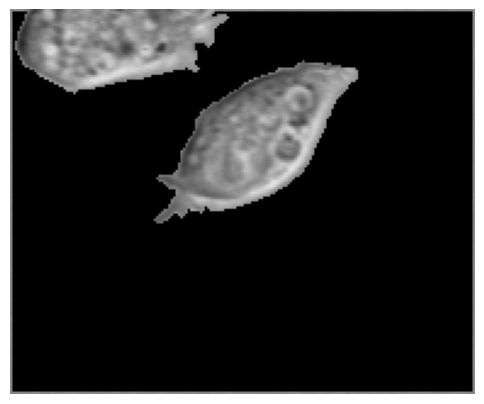

In [63]:
show_image(apply_mask(cell, invert_binary(segmented)))

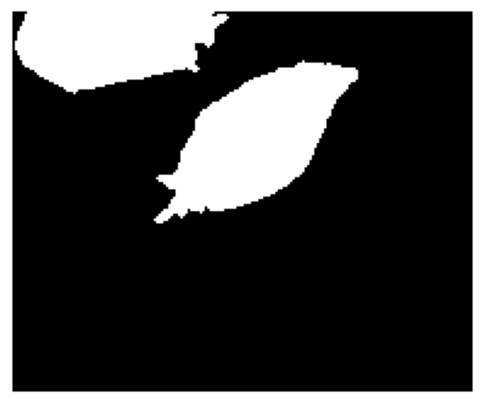

In [64]:
def watershed_segmentation(img, blur_size=2, blur_strength=1.5, kernel_shape='ellipse',
                            morph_iter=2, dist_thresh=0.5, dilate_iter=3):
    if len(img.shape) == 3:
        img = convert_color(img, 'GRAYSCALE')

    blurred = gaussian_blur(img, size=blur_size, strength=blur_strength)

    # Otsu threshold
    _, binary = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    binary = binary.astype(np.uint8)

    # Structuring element
    if kernel_shape == 'ellipse':
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    elif kernel_shape == 'rect':
        kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    elif kernel_shape == 'cross':
        kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (3, 3))
    else:
        raise ValueError("Invalid kernel shape. Choose from: ellipse, rect, cross.")

    # Morphological opening
    opened = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=morph_iter)

    # Distance transform and foreground thresholding
    dist = cv2.distanceTransform(opened, cv2.DIST_L2, 5)
    _, sure_fg = cv2.threshold(dist, dist_thresh * dist.max(), 255, 0)
    sure_fg = sure_fg.astype(np.uint8)

    sure_bg = cv2.dilate(opened, kernel, iterations=dilate_iter)
    unknown = cv2.subtract(sure_bg, sure_fg)

    # Markers for watershed
    _, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown == 255] = 0

    # Watershed
    color = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    markers = cv2.watershed(color, markers)

    # Final mask
    segmented = np.zeros_like(img)
    segmented[markers > 1] = 255

    return segmented

img = read_image("data/cells.png", mode='GRAYSCALE')
mask = watershed_segmentation(img)
show_image(invert_binary(mask))

| Parameter      | Type     | Description |
|----------------|----------|-------------|
| `img`          | `np.ndarray` | Input image (grayscale or color). If color, it will be converted to grayscale. |
| `blur_size`    | `int`    | Size of the Gaussian blur (acts like sigma base). Helps reduce noise. |
| `blur_strength`| `float`  | Multiplier for blur intensity. Larger values smooth more. |
| `kernel_shape` | `str`    | Shape of the structuring element used in morphology. One of: `'ellipse'`, `'rect'`, `'cross'`. |
| `morph_iter`   | `int`    | Number of times to apply morphological opening (removes noise and separates objects). |
| `dist_thresh`  | `float`  | Threshold (as a fraction of max) for distance transform to identify foreground. |
| `dilate_iter`  | `int`    | Iterations of dilation to define the sure background. |

1. **Convert to Grayscale**:  
   Ensures consistent behavior for downstream processing.

2. **Gaussian Blur**:  
   Smooths the image to remove noise and small artifacts.

3. **Otsu Thresholding**:  
   Automatically binarizes the image to separate foreground and background.

4. **Morphological Opening**:  
   Removes small white noise and separates weakly connected objects.

5. **Distance Transform**:  
   Highlights the "center" of each object by calculating distance from the nearest zero pixel.

6. **Sure Foreground and Background Extraction**:
   - Foreground: Pixels far enough from boundaries (high distance).
   - Background: Dilated opened mask.
   - Unknown region: Background − Foreground.

7. **Connected Components + Watershed Markers**:  
   - Label each connected foreground region with a unique ID.
   - Add `1` to all labels and assign `0` to unknowns.
   - Apply `cv2.watershed` to refine segmentation.

8. **Output Binary Mask**:  
   A mask with foreground objects labeled as white (`255`), background as black (`0`).

Best gradient method: sobel


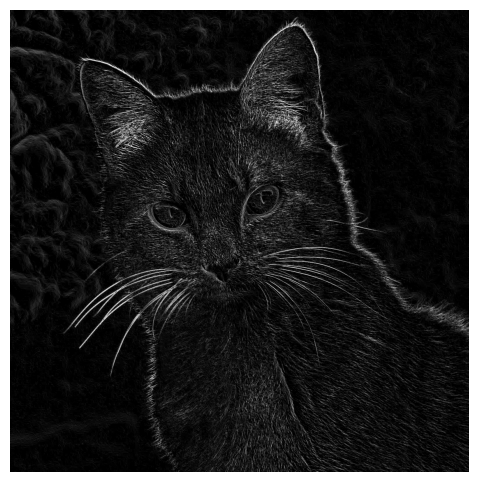

Best Canny thresholds: (30, 120)


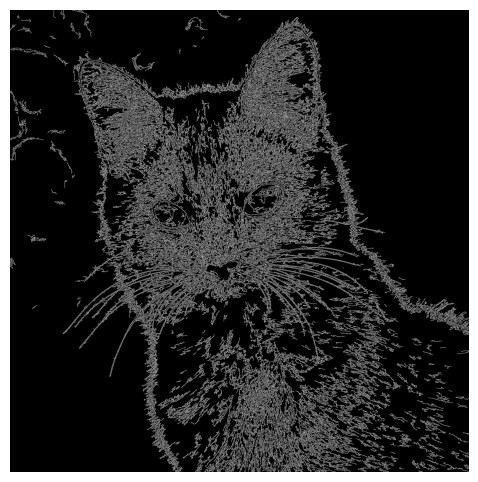

In [68]:
def best_gradient_edge_auto(img):
    methods = {
        'sobel': (np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]),
                  np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])),
        'prewitt': (np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]]),
                    np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])),
        'roberts': (np.array([[1, 0], [0, -1]]),
                    np.array([[0, 1], [-1, 0]]))
    }

    best_energy = -1
    best_edge = None
    best_method = None

    for name, (kx, ky) in methods.items():
        edge = apply_edge_filter(img, kx, ky)
        energy = np.sum(edge.astype(np.float32) ** 2)
        if energy > best_energy:
            best_energy = energy
            best_edge = edge
            best_method = name

    return best_edge, best_method

def best_canny_edge_auto(img, thresholds=[(50, 100), (100, 200), (75, 150), (30, 120)]):
    best_energy = -1
    best_edge = None
    best_thresh = None

    for low, high in thresholds:
        edge = canny_edge(img, low, high)
        energy = np.sum(edge.astype(np.float32) ** 2)
        if energy > best_energy:
            best_energy = energy
            best_edge = edge
            best_thresh = (low, high)

    return best_edge, best_thresh

# Load image
img = read_image("data/cat.jpg")  # grayscale or RGB image

# === Try best gradient-based edge detection ===
best_grad_edge, grad_method = best_gradient_edge_auto(img)
print(f"Best gradient method: {grad_method}")
show_image(best_grad_edge)

# === Try best canny edge detection ===
best_canny_edge, best_thresh = best_canny_edge_auto(img)
print(f"Best Canny thresholds: {best_thresh}")
show_image(best_canny_edge)